In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle5 as pickle
import numpy as np
import plotly.express as px
import seaborn as sns

from scipy.stats import zscore

# CNRA Comparison
_CNRA data available at:_ https://data.cnra.ca.gov/dataset/periodic-groundwater-level-measurements
 - Establish lat/long coordinates from csv files to map to gridded GLDAS/GRACE data arrays
 - Find wells with measurements for 2003-2016 from the CNRA data
 - Find nearest lat/long GRACE measurements to compare catdef to GSE_GWE
 - Output comparison of scaled measurements from CNRA and GRACE/GLDAS

## Read in Data

In [6]:
with open('all_data.pkl', 'rb') as f:
    all_data = pickle.load(f)
    
all_data.head()

,Year,Month,SCA,Landsat_Image,BW_SCA_Image,Color_SCA_Image,catdef,rzexc,evap,srfexc,sfmc,capac,Snowf,Rainf,prmc,sumwesn,runoff,Tair,RainfC,rzmc
0,2003,1,294585,<PIL.Image.Image image mode=RGB size=480x480 a...,<PIL.Image.Image image mode=1 size=570x660 at ...,<PIL.Image.Image image mode=RGBA size=570x660 ...,"[[nan, nan, nan, 38.347, 58.863, 72.956, 104.4...","[[nan, nan, nan, 2.8021, 3.8333, 3.6458, 2.835...","[[nan, nan, nan, 1.9842, 1.8075, 1.1867, 1.024...","[[nan, nan, nan, -0.25451, -0.26739, -0.30132,...","[[nan, nan, nan, 0.45009, 0.41456000000000004,...","[[nan, nan, nan, 0.07147200000000001, 0.069579...","[[nan, nan, nan, 0.0, 4.0366999999999995e-05, ...","[[nan, nan, nan, 9.8164, 9.1992, 7.3516, 5.421...","[[nan, nan, nan, 0.46491000000000005, 0.42658,...","[[nan, nan, nan, 1.9386e-05, 0.00053811, 0.009...","[[nan, nan, nan, 7.8125, 7.9023, 6.6211, 3.629...","[[nan, nan, nan, 284.14, 283.06, 281.55, 281.1...","[[nan, nan, nan, 0.12506, 0.12585, 0.10165, 0....","[[nan, nan, nan, 0.47278000000000003, 0.442019..."
1,2003,2,19185627,<PIL.Image.Image image mode=RGB size=480x480 a...,<PIL.Image.Image image mode=1 size=570x660 at ...,<PIL.Image.Image image mode=RGBA size=570x660 ...,"[[nan, nan, nan, 54.951, 79.32600000000001, 90...","[[nan, nan, nan, 1.7583, 1.871, 1.7959, 1.2065...","[[nan, nan, nan, 2.3223, 1.939, 1.5134, 1.5090...","[[nan, nan, nan, -0.48801000000000005, -0.486,...","[[nan, nan, nan, 0.43295, 0.39828, 0.36313, 0....","[[nan, nan, nan, 0.067444, 0.10471, 0.092987, ...","[[nan, nan, nan, 0.027298000000000003, 0.04013...","[[nan, nan, nan, 4.377, 4.3574, 3.7314, 2.8877...","[[nan, nan, nan, 0.45143, 0.40968999999999994,...","[[nan, nan, nan, 0.0026054000000000003, 0.0053...","[[nan, nan, nan, 3.4277, 3.8438, 3.5537, 2.386...","[[nan, nan, nan, 281.02, 279.66, 278.21, 278.1...","[[nan, nan, nan, 0.35803, 0.32971, 0.230590000...","[[nan, nan, nan, 0.45508000000000004, 0.42786,..."
2,2003,3,39522095,<PIL.Image.Image image mode=RGB size=480x480 a...,<PIL.Image.Image image mode=1 size=570x660 at ...,<PIL.Image.Image image mode=RGBA size=570x660 ...,"[[nan, nan, nan, 58.096000000000004, 80.846, 9...","[[nan, nan, nan, 3.0619, 3.3489999999999998, 2...","[[nan, nan, nan, 2.252, 2.0894, 1.7779, 1.9288...","[[nan, nan, nan, -0.28013000000000005, -0.2856...","[[nan, nan, nan, 0.43599, 0.40242, 0.365309999...","[[nan, nan, nan, 0.059937, 0.09848, 0.10797000...","[[nan, nan, nan, 0.00029898, 0.001753300000000...","[[nan, nan, nan, 8.875, 8.3047, 6.4688, 5.0547...","[[nan, nan, nan, 0.45028, 0.40975, 0.3652, 0.3...","[[nan, nan, nan, 1.5571999999999999e-06, 9.130...","[[nan, nan, nan, 5.7129, 5.6113, 4.375, 2.9229...","[[nan, nan, nan, 282.26, 281.13, 279.84, 279.9...","[[nan, nan, nan, 0.31006, 0.2572, 0.17047, 0.1...","[[nan, nan, nan, 0.4537, 0.42867, 0.38632, 0.3..."
3,2003,4,53739475,<PIL.Image.Image image mode=RGB size=480x480 a...,<PIL.Image.Image image mode=1 size=570x660 at ...,<PIL.Image.Image image mode=RGBA size=570x660 ...,"[[nan, nan, nan, 50.902, 74.34, 89.059, 98.902...","[[nan, nan, nan, 3.2247, 3.7618, 3.4259, 2.673...","[[nan, nan, nan, 2.4907, 2.2066, 2.021, 2.1504...","[[nan, nan, nan, -0.1607, -0.14800000000000002...","[[nan, nan, nan, 0.44292, 0.40849, 0.3726, 0.3...","[[nan, nan, nan, 0.079956, 0.12982, 0.19555999...","[[nan, nan, nan, 0.38354, 0.65161, 0.88013, 0....","[[nan, nan, nan, 8.6953, 8.5234, 7.334, 6.5078...","[[nan, nan, nan, 0.45588, 0.41511000000000003,...","[[nan, nan, nan, 0.074188, 0.14722000000000002...","[[nan, nan, nan, 6.0234, 6.3164, 5.4961, 4.298...","[[nan, nan, nan, 280.85, 279.66, 278.47, 278.7...","[[nan, nan, nan, 0.68433, 0.58594, 0.42126, 0....","[[nan, nan, nan, 0.46101000000000003, 0.43318,..."
4,2003,5,46363941,<PIL.Image.Image image mode=RGB size=480x480 a...,<PIL.Image.Image image mode=1 size=570x660 at ...,<PIL.Image.Image image mode=RGBA size=570x660 ...,"[[nan, nan, nan, 77.083, 103.3, 112.11, 113.8,...","[[nan, nan, nan, 0.016929, -0.53873, -0.45475,...","[

In [7]:
# All measurement data
mm = pd.read_csv('measurements.csv')
print(mm.shape)
mm.head()

(2532213, 14)


,SITE_CODE,WLM_ID,MSMT_DATE,WLM_RPE,WLM_GSE,GWE,GSE_GWE,WLM_QA_DESC,WLM_DESC,WLM_ACC_DESC,WLM_ORG_NAME,COOP_ORG_NAME,MONITORING_PROGRAM,MSMT_CMT
0,320000N1140000W001,3016758,2021-08-26 20:00:00,545.92,545.92,133.92,412.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN
1,320000N1140000W001,3016757,2021-07-29 19:00:00,545.92,545.92,135.92,410.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN
2,320000N1140000W001,3016756,2021-06-24 18:00:00,545.92,545.92,134.92,411.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN
3,320000N1140000W001,3016755,2021-05-27 17:00:00,545.92,545.92,134.92,411.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN
4,320000N1140000W001,3016754,2021-04-29 16:00:00,545.92,545.92,136.92,409.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN


In [8]:
# All station data
st = pd.read_csv('stations.csv')
print(st.shape)
st.head()

(45923, 17)


,STN_ID,SITE_CODE,SWN,WELL_NAME,LATITUDE,LONGITUDE,GSE,GSE_METHOD,GSE_ACC,BASIN_CODE,BASIN_NAME,COUNTY_NAME,WELL_DEPTH,WELL_USE,WELL_TYPE,WCR_NO,MONITORING_PROGRAM
0,51445,320000N1140000W001,NaN,Bay Ridge,36.5605,-121.755,NaN,Unknown,Unknown,NaN,NaN,Monterey,NaN,Residential,Part of a nested/multi-completion well,NaN,VOLUNTARY
1,25067,325450N1171061W001,19S02W05K003S,NaN,32.5450,-117.106,17.14,Unknown,Unknown,9-033,Coastal Plain Of San Diego,San Diego,NaN,Unknown,Unknown,NaN,VOLUNTARY
2,25068,325450N1171061W002,19S02W05K004S,NaN,32.5450,-117.106,17.14,Unknown,Unknown,9-033,Coastal Plain Of San Diego,San Diego,NaN,Unknown,Unknown,NaN,VOLUNTARY
3,39833,325450N1171061W003,19S02W05K005S,NaN,32.5450,-117.106,17.14,Unknown,Unknown,9-033,Coastal Plain Of San Diego,San Diego,NaN,Unknown,Unknown,NaN,VOLUNTARY
4,25069,325450N1171061W004,19S02W05K006S,NaN,32.5450,-117.106,17.14,Unknown,Unknown,9-033,Coastal Plain Of San Diego,San Diego,NaN,Unknown,Unknown,NaN,VOLUNTARY


## Create Grid of Approximate Lat/Long Coordinates in catdef etc. arrays

In [9]:
# grid is 33X37 for measurements
all_data['catdef'][0].shape

(33, 37)

In [10]:
lon = pd.read_csv('lon.csv', header=None)
lon

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,-125.66,-125.29,-124.92,-124.54,-124.17,-123.8,-123.42,-123.05,-122.68,-122.3,...,-115.58,-115.21,-114.83,-114.46,-114.09,-113.71,-113.34,-112.97,-112.59,-112.22


In [11]:
# to approximate grid midpoints, 
# note lat is 34 in length (makes sense), 
# lon is 37 (will work, but should be grid + 1)

lat = pd.read_csv('lat.csv', header=None)
lon = pd.read_csv('lon.csv', header=None)
lon = lon.T

print(len(lat[0]))
print(len(lon[0]))
lat.head()

34
37


,0
0,42.948
1,42.565
2,42.185
3,41.808
4,41.432


In [12]:
# get list of midpoints for lat measurements
lat_csv_list = list(lat[0])
lat_list = [np.mean(lat_csv_list[i:i + 2]) for i in range(len(lat[0]) -1)]
# and just take the 37 lon measurements
lon_list = list(lon[0])

print("Latitudes:", len(lat_list))
print("Longitudes:", len(lon_list))
print(lat_list)
print(lon_list)

Latitudes: 33
Longitudes: 37
[42.7565, 42.375, 41.9965, 41.620000000000005, 41.245000000000005, 40.8725, 40.5025, 40.134, 39.7675, 39.403, 39.040499999999994, 38.68, 38.321, 37.963499999999996, 37.6075, 37.2535, 36.9015, 36.551, 36.201499999999996, 35.854, 35.507999999999996, 35.163, 34.82, 34.4785, 34.138000000000005, 33.798500000000004, 33.460499999999996, 33.124, 32.789, 32.455, 32.122, 31.7905, 31.46]
[-125.66, -125.29, -124.92, -124.54, -124.17, -123.8, -123.42, -123.05, -122.68, -122.3, -121.93, -121.56, -121.18, -120.81, -120.44, -120.06, -119.69, -119.32, -118.94, -118.57, -118.2, -117.82, -117.45, -117.07, -116.7, -116.33, -115.95, -115.58, -115.21, -114.83, -114.46, -114.09, -113.71, -113.34, -112.97, -112.59, -112.22]


In [13]:
# create array-like list of locations
loc_grid = [[(long,lat) for long in lon_list] for lat in lat_list]
print("Location dimensions:", len(loc_grid), "X", len(loc_grid[0]))
print(loc_grid[0])
print(loc_grid[-1])

Location dimensions: 33 X 37
[(-125.66, 42.7565), (-125.29, 42.7565), (-124.92, 42.7565), (-124.54, 42.7565), (-124.17, 42.7565), (-123.8, 42.7565), (-123.42, 42.7565), (-123.05, 42.7565), (-122.68, 42.7565), (-122.3, 42.7565), (-121.93, 42.7565), (-121.56, 42.7565), (-121.18, 42.7565), (-120.81, 42.7565), (-120.44, 42.7565), (-120.06, 42.7565), (-119.69, 42.7565), (-119.32, 42.7565), (-118.94, 42.7565), (-118.57, 42.7565), (-118.2, 42.7565), (-117.82, 42.7565), (-117.45, 42.7565), (-117.07, 42.7565), (-116.7, 42.7565), (-116.33, 42.7565), (-115.95, 42.7565), (-115.58, 42.7565), (-115.21, 42.7565), (-114.83, 42.7565), (-114.46, 42.7565), (-114.09, 42.7565), (-113.71, 42.7565), (-113.34, 42.7565), (-112.97, 42.7565), (-112.59, 42.7565), (-112.22, 42.7565)]
[(-125.66, 31.46), (-125.29, 31.46), (-124.92, 31.46), (-124.54, 31.46), (-124.17, 31.46), (-123.8, 31.46), (-123.42, 31.46), (-123.05, 31.46), (-122.68, 31.46), (-122.3, 31.46), (-121.93, 31.46), (-121.56, 31.46), (-121.18, 31.46), (

## Plot example stations
 - Maps a random selection of station locations and corroborates with grid

In [14]:
# get random sample of 10 stations
st_samp = st.sample(10)[['SITE_CODE', 'LATITUDE', 'LONGITUDE']].copy()
st_samp

,SITE_CODE,LATITUDE,LONGITUDE
39805,379949N1213426W001,37.9949,-121.343
13226,347522N1180463W001,34.7522,-118.046
11250,345873N1179671W001,34.5873,-117.967
45152,400880N1221610W001,40.0880,-122.161
33202,369296N1205566W001,36.9296,-120.557
35380,371924N1205366W001,37.1924,-120.537
17172,351212N1188637W001,35.1212,-118.864
38681,376899N1218298W001,37.6899,-121.830
12717,347108N1184163W001,34.7108,-118.416
39838,380136N1211738W001,38.0136,-121.174


In [15]:
fig = px.scatter_geo(st_samp, 
                     lat='LATITUDE',
                     lon='LONGITUDE', 
                     hover_name="SITE_CODE", 
                     locationmode='USA-states')#,
                     #color='red')
fig.update_geos(
    visible=False, 
    resolution=110, 
    scope="usa",
    showcountries=True, countrycolor="Black",
    showsubunits=True, subunitcolor="Blue",
    showland=True, landcolor="LightYellow",
    showocean=True, oceancolor="LightBlue"
)
fig.update_layout(title = 'CA Sample Site Map', title_x=0.5)
fig.show()

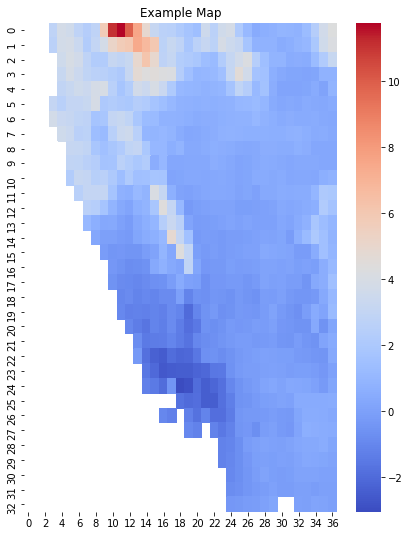

In [16]:
# confirm sites are being mapped to correct places on grid
##########################################################
# using a random measurement of rzexc
ex_map = all_data['rzexc'][0].copy()

f, ax = plt.subplots(figsize=(7,9))
ax = sns.heatmap(ex_map, cmap="coolwarm")
plt.title("Example Map")
print()

In [17]:
def find_nearest_loc(input_lat, input_lon, grid):
    '''Finds raw euclidean distance by lat/lon and returns grid location of nearest point'''
    min_dist = 1000
    for row in range(len(grid)):
        for col in range(len(grid)):
            dist = np.sqrt(((grid[row][col][0] - input_lon)**2) + ((grid[row][col][1] - input_lat)**2))
            if dist < min_dist:
                min_dist = dist
                return_loc = [row, col]
    
    return return_loc

In [18]:
# finds corresponding grid loc for stations sample
st_samp['array_loc'] = st_samp.apply(lambda x:
                                     find_nearest_loc(x['LATITUDE'], 
                                                      x['LONGITUDE'],  
                                                      loc_grid),
                                     axis=1)

st_samp

,SITE_CODE,LATITUDE,LONGITUDE,array_loc
39805,379949N1213426W001,37.9949,-121.343,"[13, 12]"
13226,347522N1180463W001,34.7522,-118.046,"[22, 20]"
11250,345873N1179671W001,34.5873,-117.967,"[23, 21]"
45152,400880N1221610W001,40.0880,-122.161,"[7, 9]"
33202,369296N1205566W001,36.9296,-120.557,"[16, 14]"
35380,371924N1205366W001,37.1924,-120.537,"[15, 14]"
17172,351212N1188637W001,35.1212,-118.864,"[21, 18]"
38681,376899N1218298W001,37.6899,-121.830,"[14, 10]"
12717,347108N1184163W001,34.7108,-118.416,"[22, 19]"
39838,380136N1211738W001,38.0136,-121.174,"[13, 12]"


Text(0.5, 1.0, 'Nearest Grid Locations (red) to Well Measurements')

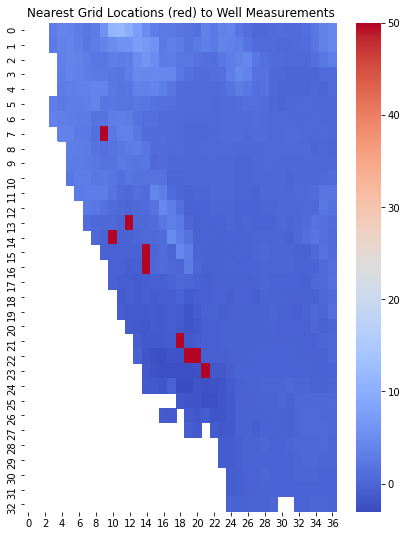

In [19]:
# color the locations identified as closest in the grid red
# confirm sites are being mapped to correct places on grid
###########################################################
ex_map = all_data['rzexc'][0].copy()


for location in st_samp['array_loc'].values:
    ex_map[location[0]][location[1]] = 50
    
f, ax = plt.subplots(figsize=(7,9))
ax = sns.heatmap(ex_map, cmap="coolwarm")
plt.title("Nearest Grid Locations (red) to Well Measurements")

## Get Subset of Stations/Measurement Data
 - Only keep information for sites that have at least 1 measurement/month for 2003-2016

In [20]:
#mm = pd.read_csv('measurements.csv')
print(mm.shape)
mm.head()

(2532213, 14)


,SITE_CODE,WLM_ID,MSMT_DATE,WLM_RPE,WLM_GSE,GWE,GSE_GWE,WLM_QA_DESC,WLM_DESC,WLM_ACC_DESC,WLM_ORG_NAME,COOP_ORG_NAME,MONITORING_PROGRAM,MSMT_CMT
0,320000N1140000W001,3016758,2021-08-26 20:00:00,545.92,545.92,133.92,412.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN
1,320000N1140000W001,3016757,2021-07-29 19:00:00,545.92,545.92,135.92,410.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN
2,320000N1140000W001,3016756,2021-06-24 18:00:00,545.92,545.92,134.92,411.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN
3,320000N1140000W001,3016755,2021-05-27 17:00:00,545.92,545.92,134.92,411.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN
4,320000N1140000W001,3016754,2021-04-29 16:00:00,545.92,545.92,136.92,409.0,NaN,Electric sounder measurement,Water level accuracy to nearest hundredth of a...,Monterey Peninsula Water Management District,Monterey Peninsula Water Management District,VOLUNTARY,NaN


In [21]:
# convert to date_time and get month/year date column
mm["MSMT_DATE"] = pd.to_datetime(mm['MSMT_DATE'], format='%Y-%m-%d %H:%M:%S')
mm['MSMT_month_year'] = mm['MSMT_DATE'].dt.to_period('M')
mm.dtypes

SITE_CODE                     object
WLM_ID                         int64
MSMT_DATE             datetime64[ns]
WLM_RPE                      float64
WLM_GSE                      float64
GWE                          float64
GSE_GWE                      float64
WLM_QA_DESC                   object
WLM_DESC                      object
WLM_ACC_DESC                  object
WLM_ORG_NAME                  object
COOP_ORG_NAME                 object
MONITORING_PROGRAM            object
MSMT_CMT                      object
MSMT_month_year            period[M]
dtype: object

In [22]:
mm[['MSMT_DATE', 'MSMT_month_year']].sample(20)

,MSMT_DATE,MSMT_month_year
1998648,1990-10-11 00:00:00,1990-10
2017915,1981-04-16 00:00:00,1981-04
2215679,1980-11-24 00:00:00,1980-11
1695572,1979-10-31 00:00:00,1979-10
1526727,2004-03-15 00:00:00,2004-03
1803430,2003-11-01 00:00:00,2003-11
1239612,1937-02-02 00:00:00,1937-02
24378,1974-12-11 00:00:00,1974-12
742720,1971-11-02 00:00:00,1971-11
1602872,1991-09-27 12:00:00,1991-09


In [23]:
# subset to measurements from 2003-2016
mm_sub = mm[(mm['MSMT_month_year'] >= "2003-01") & (mm['MSMT_month_year'] <= "2016-12")]
mm_sub.shape

(802778, 15)

In [24]:
# mean monthly measurement of GSE_GWE
GSE_Monthly = mm_sub.groupby(['SITE_CODE', 'MSMT_month_year'], as_index=False)['GSE_GWE'].mean()
GSE_Monthly

,SITE_CODE,MSMT_month_year,GSE_GWE
0,320000N1140000W001,2016-01,375.0
1,320000N1140000W001,2016-02,375.0
2,320000N1140000W001,2016-03,382.0
3,320000N1140000W001,2016-04,374.0
4,320000N1140000W001,2016-05,435.0
...,...,...,...
489405,420171N1214111W001,2015-09,62.9
489406,420171N1214111W001,2015-10,59.6
489407,420171N1214111W001,2015-12,59.6
489408,420171N1214111W001,2016-03,58.1


In [25]:
# count measurements for every sitecode
meas_counts = pd.DataFrame(GSE_Monthly['SITE_CODE'].value_counts())
meas_counts.reset_index(inplace=True)
meas_counts.rename(columns = {'index': 'SITE_CODE',
                              'SITE_CODE': 'Obs_count'}, inplace=True)
meas_counts.head()

,SITE_CODE,Obs_count
0,340009N1170735W001,168
1,369786N1219031W001,168
2,369996N1218612W001,168
3,332742N1166846W001,168
4,369760N1218695W001,168


In [26]:
# 39 stations have all monthly measurements
meas_counts[meas_counts['Obs_count'] == 168]

,SITE_CODE,Obs_count
0,340009N1170735W001,168
1,369786N1219031W001,168
2,369996N1218612W001,168
3,332742N1166846W001,168
4,369760N1218695W001,168
5,332839N1167395W001,168
6,332867N1167043W001,168
7,333103N1166879W001,168
8,353037N1192699W002,168
9,353037N1192699W001,168


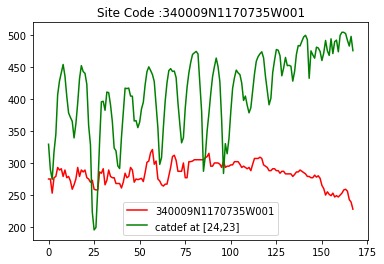

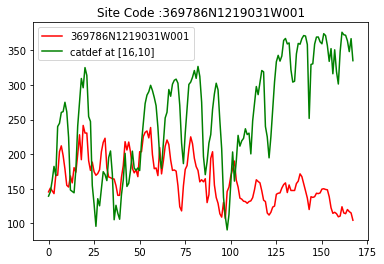

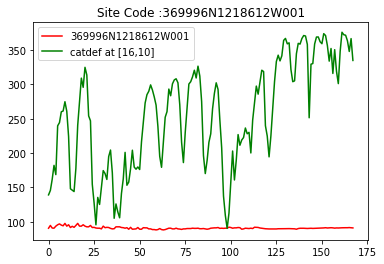

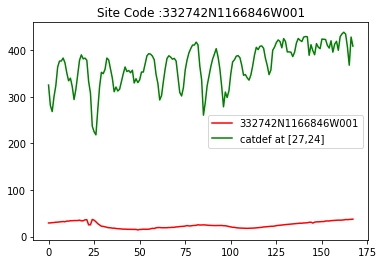

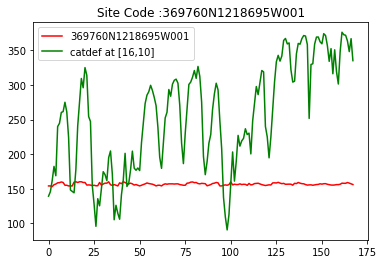

...

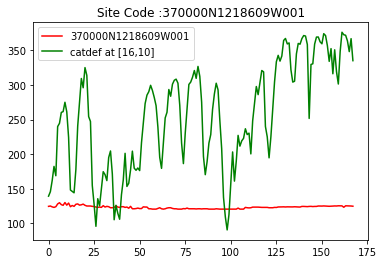

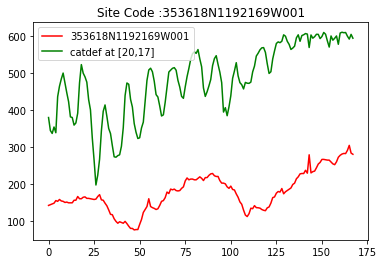

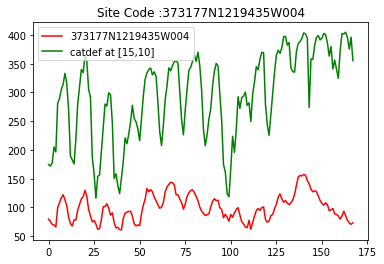

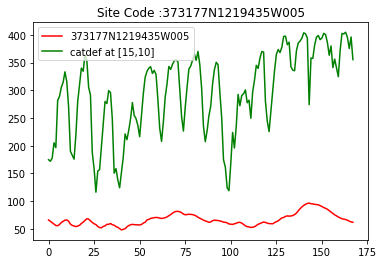

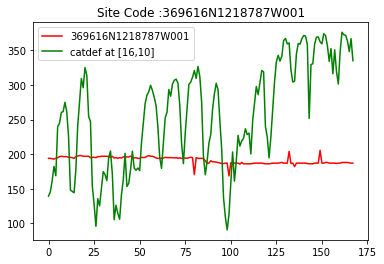

In [27]:
# plot all raw measurements of catdef vs. GSE_GWE
for sc in meas_counts[meas_counts['Obs_count'] == 168]['SITE_CODE'].values:
    # get lat and long from stations dataset
    lat1 = st[st['SITE_CODE'] == sc]['LATITUDE'].values[0]
    long1 = st[st['SITE_CODE'] == sc]['LONGITUDE'].values[0]
    
    # find grid location
    array_loc = find_nearest_loc(lat1, long1, loc_grid)
    # get a list of catdef measurements for that location
    cat_def_list = [x[array_loc[0]][array_loc[1]] for x in all_data['catdef']]
    
    # get list of GSE measurements to plot for station
    df_GSE = GSE_Monthly[GSE_Monthly['SITE_CODE']==sc].sort_values('MSMT_month_year')['GSE_GWE'].values
    
    # simple line time series plots (thanks Eddie!)
    t = range(168)
    plt.plot(t, df_GSE, 'r')
    plt.plot(t, cat_def_list,'g')
    plt.title(f"Site Code :{sc}")
    plt.legend([sc, f'catdef at [{array_loc[0]},{array_loc[1]}]'])
    plt.show()

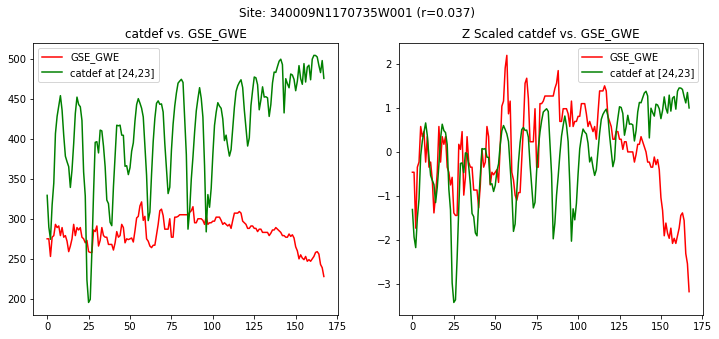

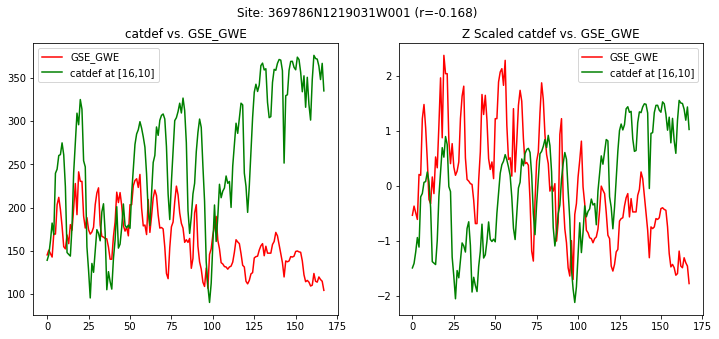

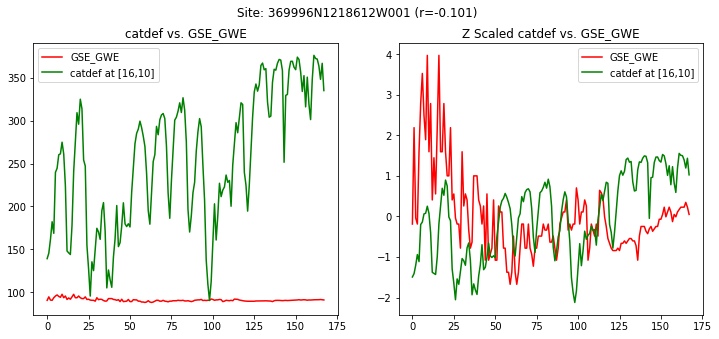

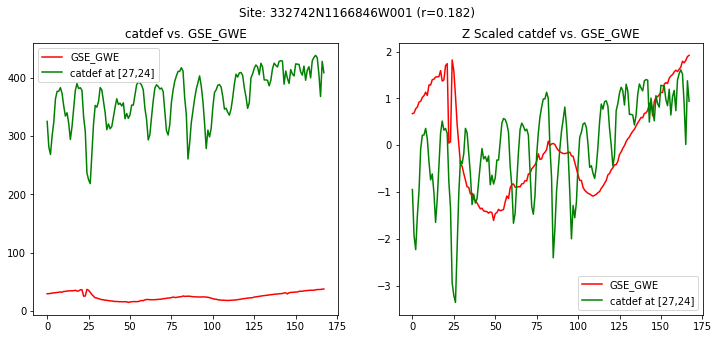

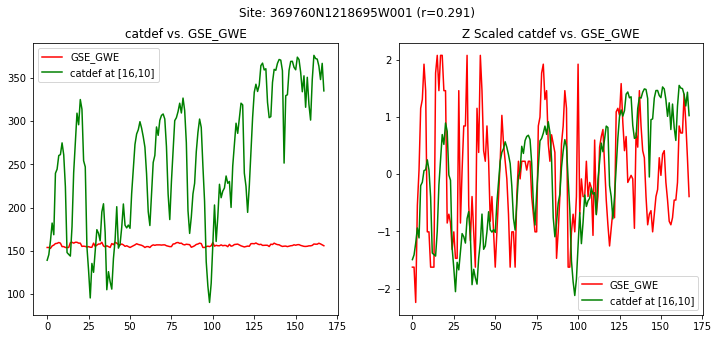

...

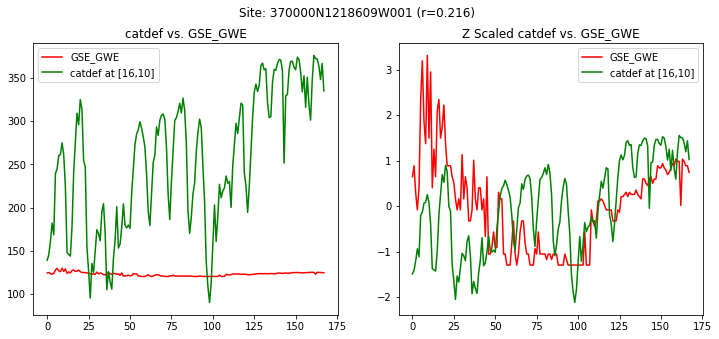

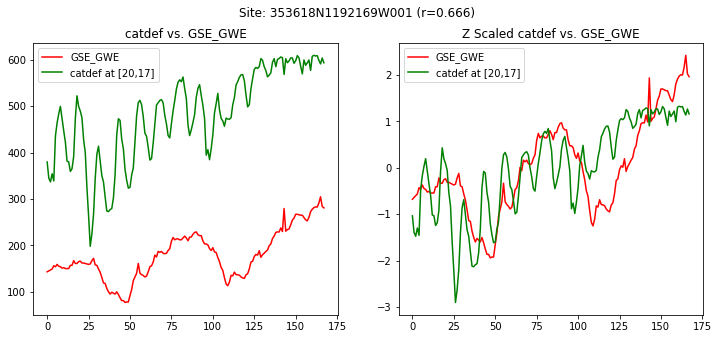

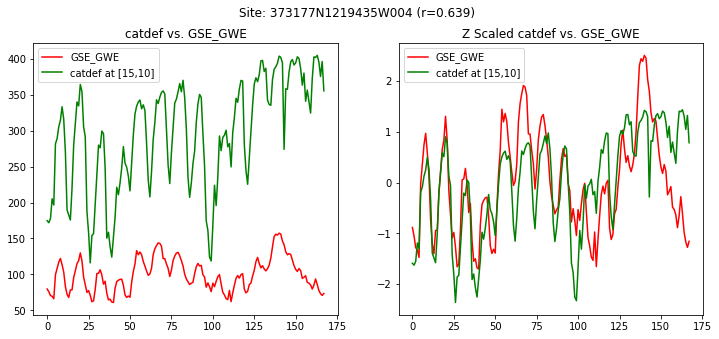

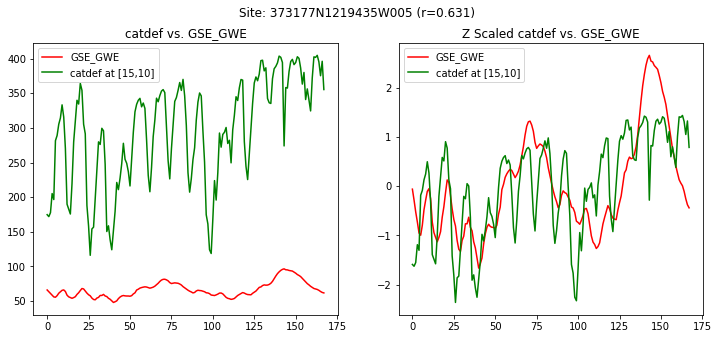

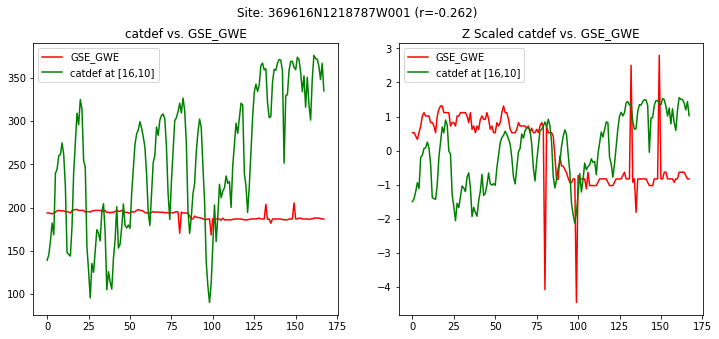

In [28]:
# plot for all site codes with full monthly measurements (w/ scaled data comparison)
#################################################################################### 
for sc in meas_counts[meas_counts['Obs_count'] == 168]['SITE_CODE'].values:
    # get lat and long from stations dataset
    lat1 = st[st['SITE_CODE'] == sc]['LATITUDE'].values[0]
    long1 = st[st['SITE_CODE'] == sc]['LONGITUDE'].values[0]
    
    # find grid location
    array_loc = find_nearest_loc(lat1, long1, loc_grid)
    # get a list of catdef measurements for that location
    cat_def_list = [x[array_loc[0]][array_loc[1]] for x in all_data['catdef']]
    
    # get list of GSE measurements to plot for station
    df_GSE = GSE_Monthly[GSE_Monthly['SITE_CODE']==sc].sort_values('MSMT_month_year')['GSE_GWE'].values
    
    # scaled measuerments
    catdef_z = zscore(cat_def_list)
    GSE_GWE_z = zscore(df_GSE)
    
    # get correlations (returns same value)
    cor1 = round(pd.Series(df_GSE).corr(pd.Series(cat_def_list)),3)
    cor2 = round(pd.Series(GSE_GWE_z).corr(pd.Series(catdef_z)),3)
    
    # simple line time series plots (thanks Eddie!)
    t = range(168)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))
    fig.suptitle(f'Site: {sc} (r={cor1})')
    ax1.plot(t, df_GSE, 'r')
    ax1.plot(t, cat_def_list,'g')
    ax1.set_title(f"catdef vs. GSE_GWE")
    ax1.legend(['GSE_GWE', f'catdef at [{array_loc[0]},{array_loc[1]}]'])
    
    ax2.plot(t, GSE_GWE_z, 'r')
    ax2.plot(t, catdef_z,'g')
    ax2.set_title(f"Z Scaled catdef vs. GSE_GWE")
    ax2.legend(['GSE_GWE', f'catdef at [{array_loc[0]},{array_loc[1]}]'])
    
    plt.show()

/Users/kiefferthomas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



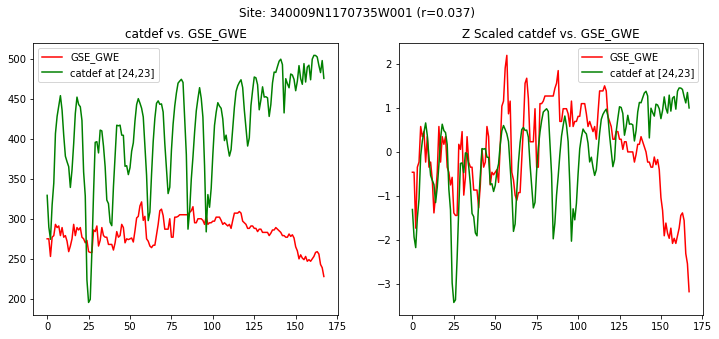

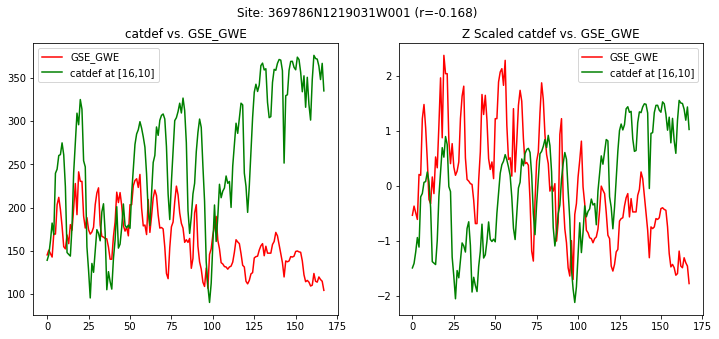

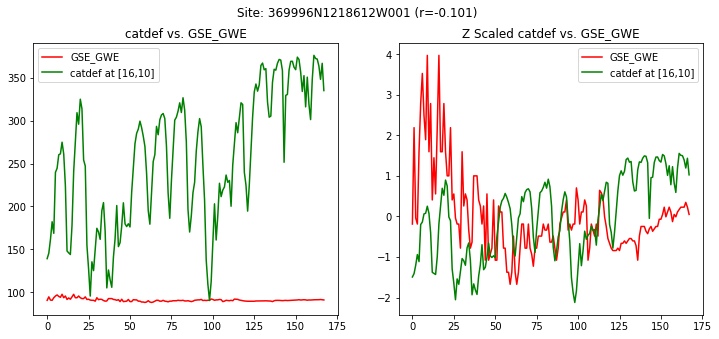

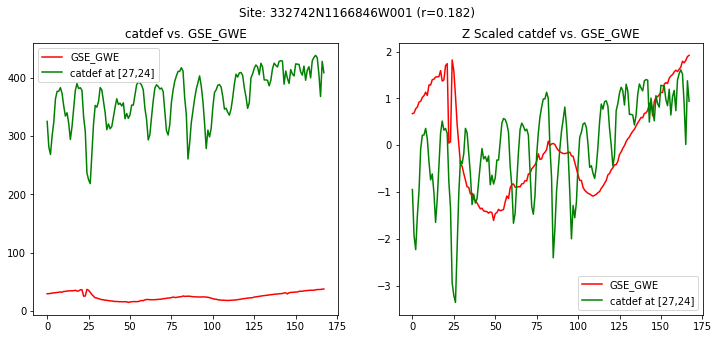

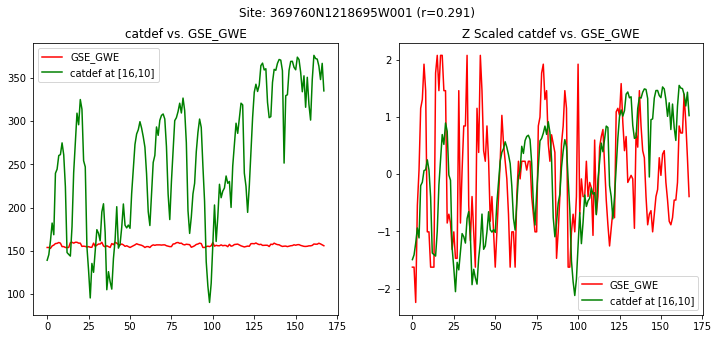

...

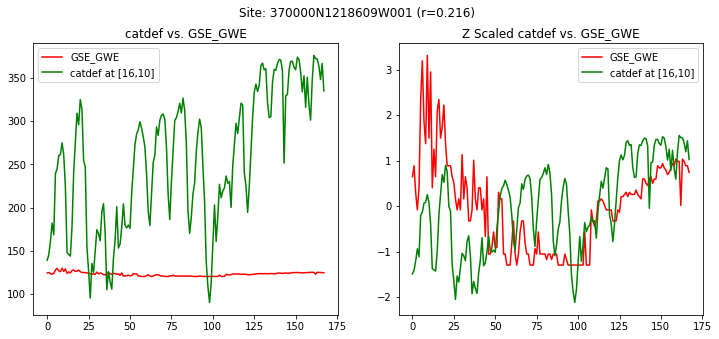

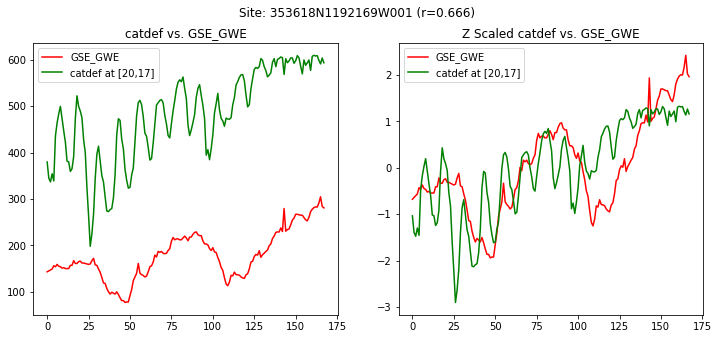

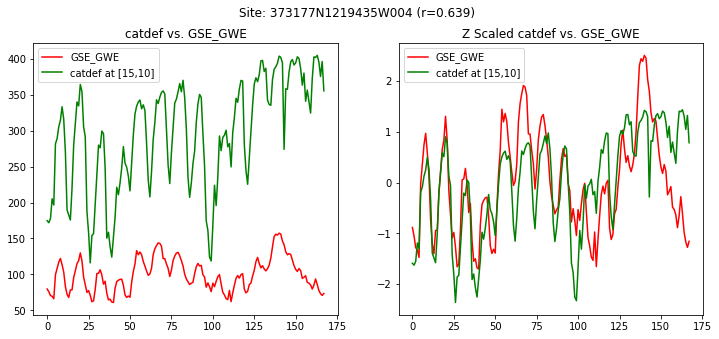

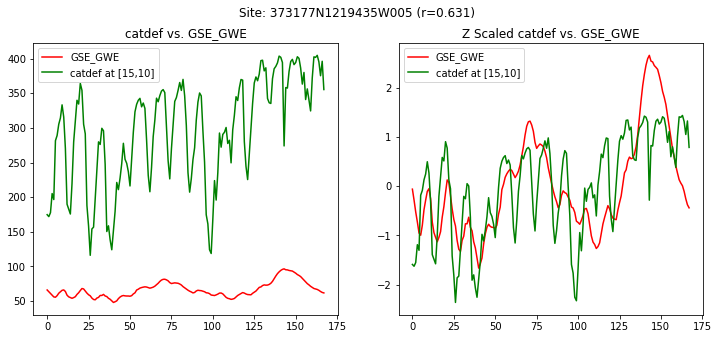

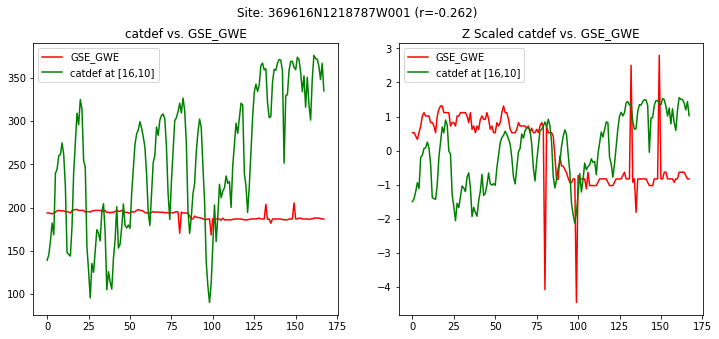

In [29]:
# writes previous plots to pdf
##############################
import matplotlib.backends.backend_pdf
pdf = matplotlib.backends.backend_pdf.PdfPages("catdef_GSE_GWE_comparisons.pdf")

for sc in meas_counts[meas_counts['Obs_count'] == 168]['SITE_CODE'].values:
    # get lat and long from stations dataset
    lat1 = st[st['SITE_CODE'] == sc]['LATITUDE'].values[0]
    long1 = st[st['SITE_CODE'] == sc]['LONGITUDE'].values[0]
    
    # find grid location
    array_loc = find_nearest_loc(lat1, long1, loc_grid)
    # get a list of catdef measurements for that location
    cat_def_list = [x[array_loc[0]][array_loc[1]] for x in all_data['catdef']]
    
    # get list of GSE measurements to plot for station
    df_GSE = GSE_Monthly[GSE_Monthly['SITE_CODE']==sc].sort_values('MSMT_month_year')['GSE_GWE'].values
    
    # scaled measuerments
    catdef_z = zscore(cat_def_list, nan_policy='omit')
    GSE_GWE_z = zscore(df_GSE, nan_policy='omit')
    
    # get correlations (returns same value)
    cor1 = round(pd.Series(df_GSE).corr(pd.Series(cat_def_list)),3)
    cor2 = round(pd.Series(GSE_GWE_z).corr(pd.Series(catdef_z)),3)
    
    # simple line time series plots (thanks Eddie!)
    t = range(168)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))
    fig.suptitle(f'Site: {sc} (r={cor1})')
    ax1.plot(t, df_GSE, 'r')
    ax1.plot(t, cat_def_list,'g')
    ax1.set_title(f"catdef vs. GSE_GWE")
    ax1.legend(['GSE_GWE', f'catdef at [{array_loc[0]},{array_loc[1]}]'])
    
    ax2.plot(t, GSE_GWE_z, 'r')
    ax2.plot(t, catdef_z,'g')
    ax2.set_title(f"Z Scaled catdef vs. GSE_GWE")
    ax2.legend(['GSE_GWE', f'catdef at [{array_loc[0]},{array_loc[1]}]'])
    
    pdf.savefig(fig)
#for fig in xrange(1, figure().number): ## will open an empty extra figure :(
#    pdf.savefig( fig )
pdf.close()